In [1]:
import numpy as np
import pandas as pd
from scipy.signal import find_peaks
import os
import matplotlib.pyplot as plt
from pathlib import Path

# Load Exercise Data for Subject 1

In [2]:
path = Path(r'D:\Jonathan\3-Datasets\syde770_processed_data\subjects_2023-07-12\S01')
valid_files = list(path.glob("*1_full.csv"))

In [3]:
def plot_imu(df, tick_size):
    fig, axs = plt.subplots(3, 1, figsize=(20, 8))
    labels = ['a_x', 'a_y', 'a_z', 'm_x', 'm_y', 'm_z', 'g_x', 'g_y', 'g_z']
    n, d = df.shape
    t = np.arange(n)
    t_ticks = np.arange(0, n, tick_size)
    
    fig.suptitle(file.name)
    

    for i in range(3):
        axs[0].plot(t, df.iloc[:, i], label=labels[i])
    axs[0].legend()
    axs[0].set_xticks(t_ticks)
    for i in range(3, 6):
        axs[1].plot(t, df.iloc[:, i], label=labels[i])
    axs[1].legend()
    axs[1].set_xticks(t_ticks)
    for i in range(6, 9):
        axs[2].plot(t, df.iloc[:, i], label=labels[i])
    axs[2].legend()
    axs[2].set_xticks(t_ticks)

    plt.show()

## Plot IMU data for S01
### Full data

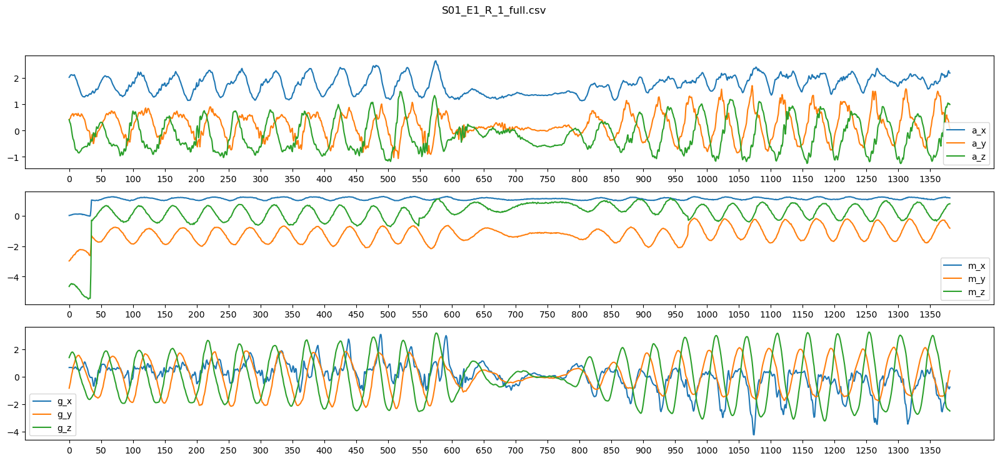

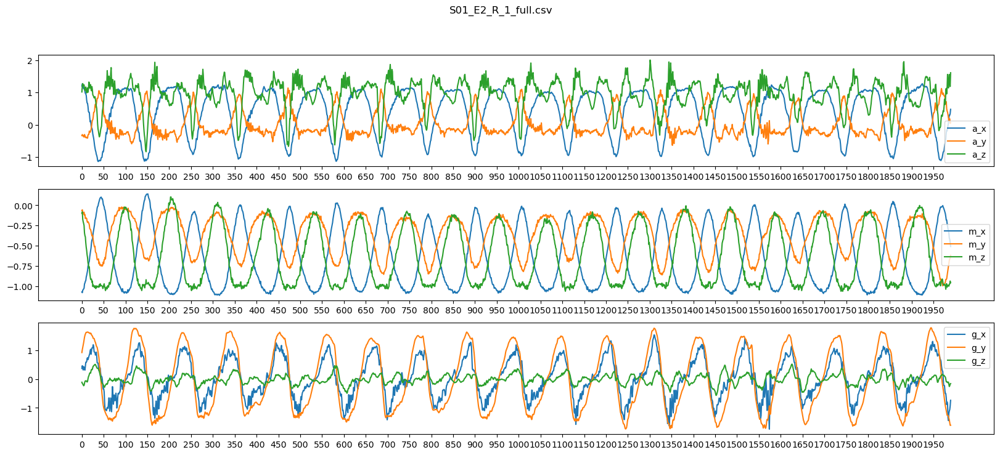

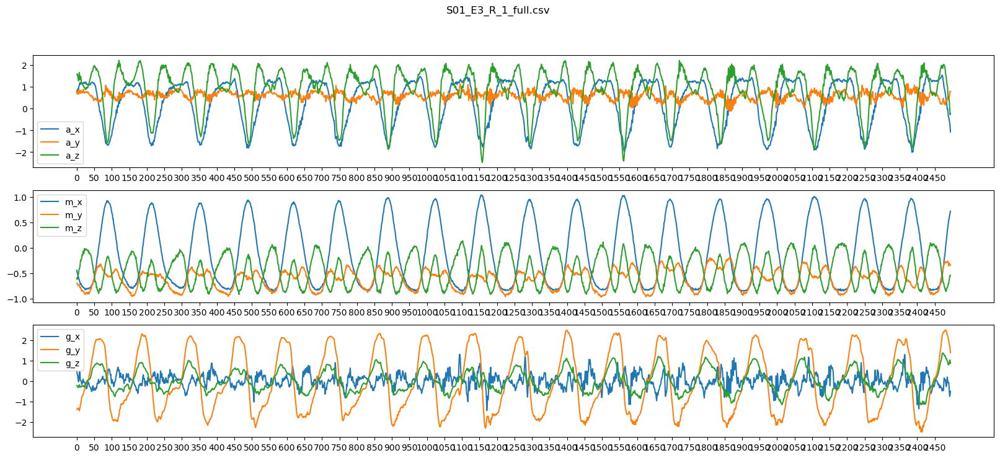

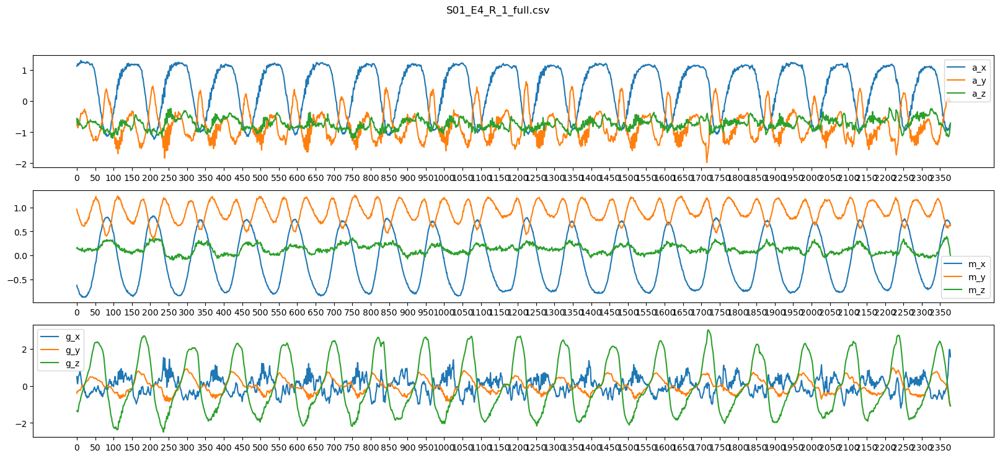

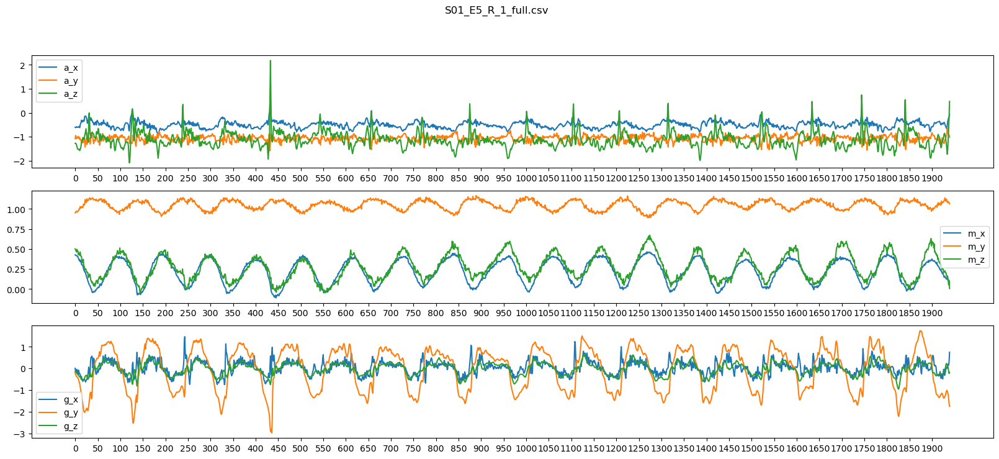

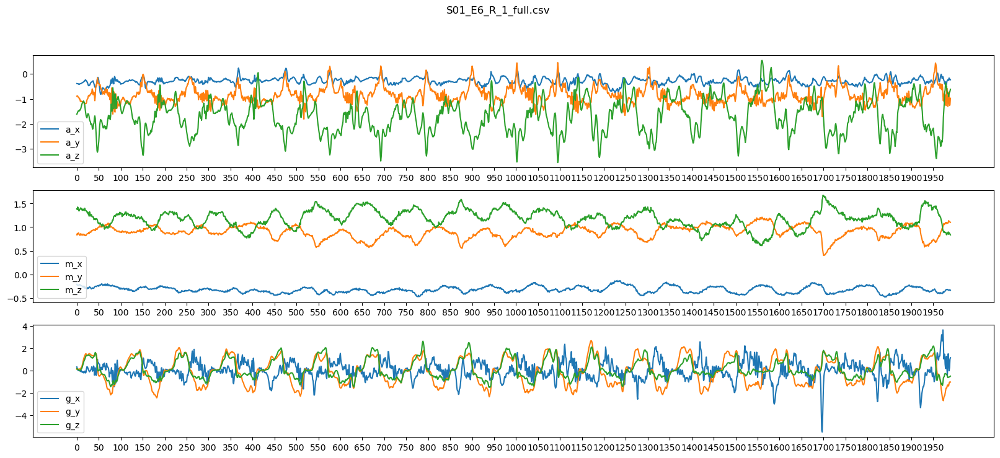

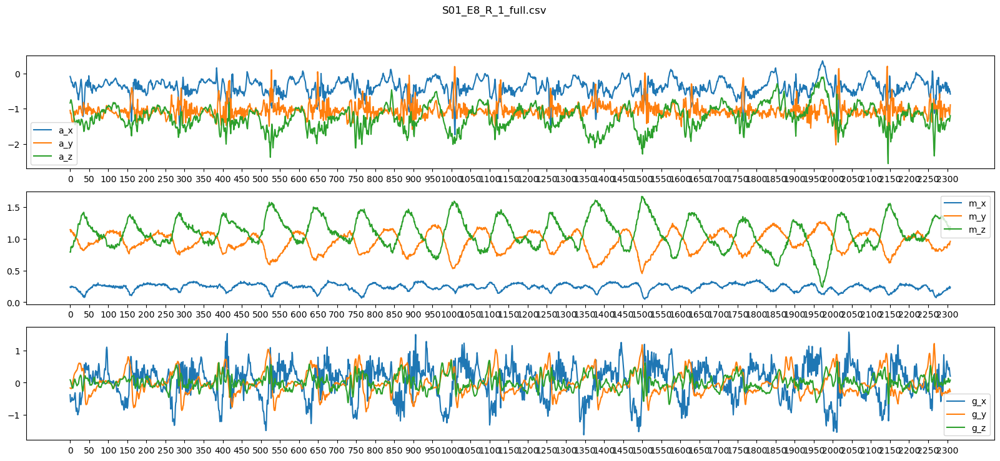

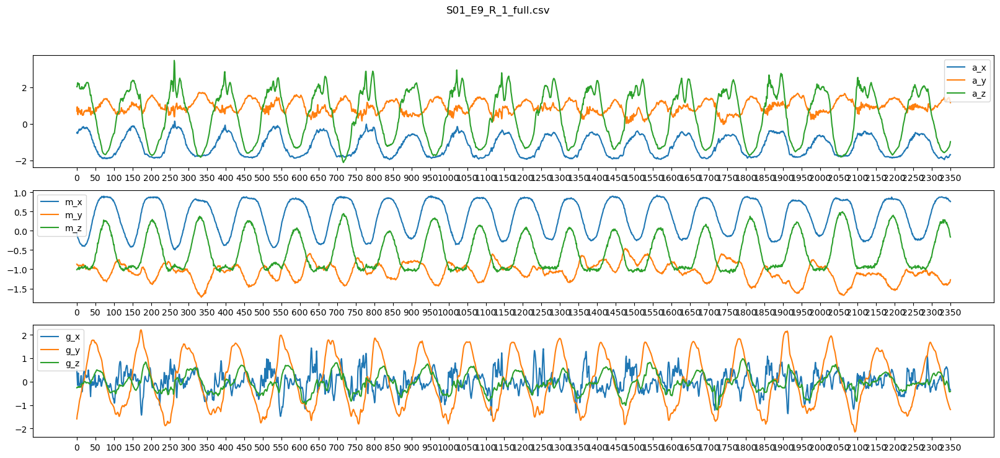

In [4]:
for file in valid_files:
    df = pd.read_csv(file)
    df = df.loc[:, 'a_1':'g_3']
    plot_imu(df, 50)

In [5]:
df.iloc[0:10]

,a_1,a_2,a_3,m_1,m_2,m_3,g_1,g_2,g_3
0,-0.491036,0.702753,2.036896,-0.048799,-0.867342,-1.011179,0.498659,-1.591389,-0.261578
1,-0.438723,0.939880,2.038025,-0.122568,-0.886890,-0.998621,0.154588,-1.439141,-0.237265
2,-0.515863,0.603950,2.250317,-0.154184,-0.886890,-0.986063,-0.156106,-1.338712,-0.235766
3,-0.475076,0.509099,2.246930,-0.189751,-0.886890,-0.981877,0.188347,-1.256752,-0.242260
4,-0.397050,0.809460,2.182565,-0.207534,-0.906439,-0.965133,0.368583,-1.170174,-0.214283
5,-0.367790,0.858862,2.148688,-0.225318,-0.921100,-0.998621,0.010399,-1.058201,-0.220278
6,-0.286217,0.690897,2.208536,-0.260885,-0.906439,-0.944203,-0.212751,-0.954693,-0.239263
7,-0.280010,0.639519,2.041413,-0.292500,-0.896664,-1.002807,-0.146951,-0.834254,-0.226273
8,-0.334097,0.731406,1.926233,-0.308308,-0.896664,-0.977691,-0.085728,-0.754603,-0.219779
9,-0.337643,0.650388,1.943171,-0.327079,-0.901551,-0.956761,-0.123491,-0.698039,-0.235766


### 500 data points

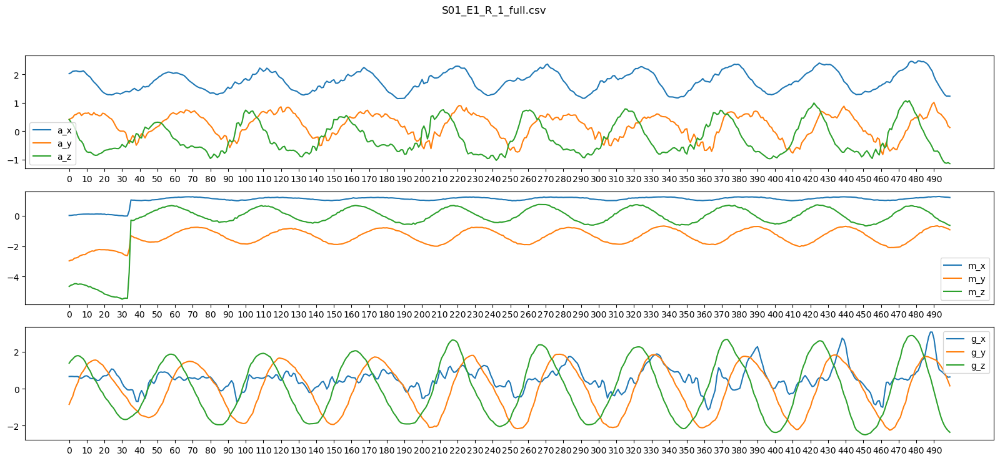

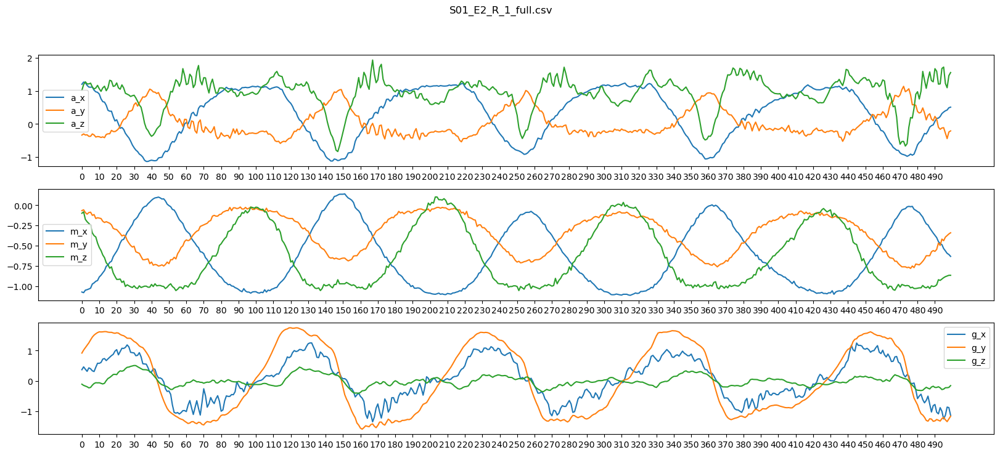

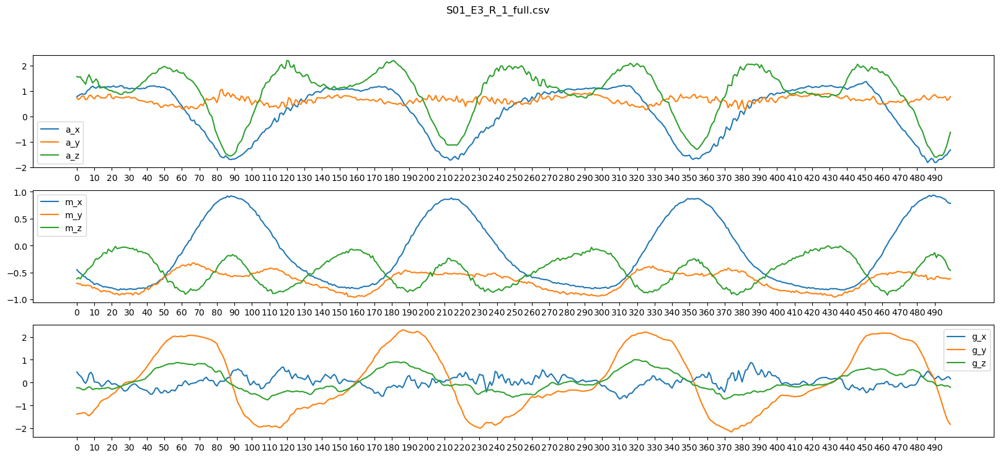

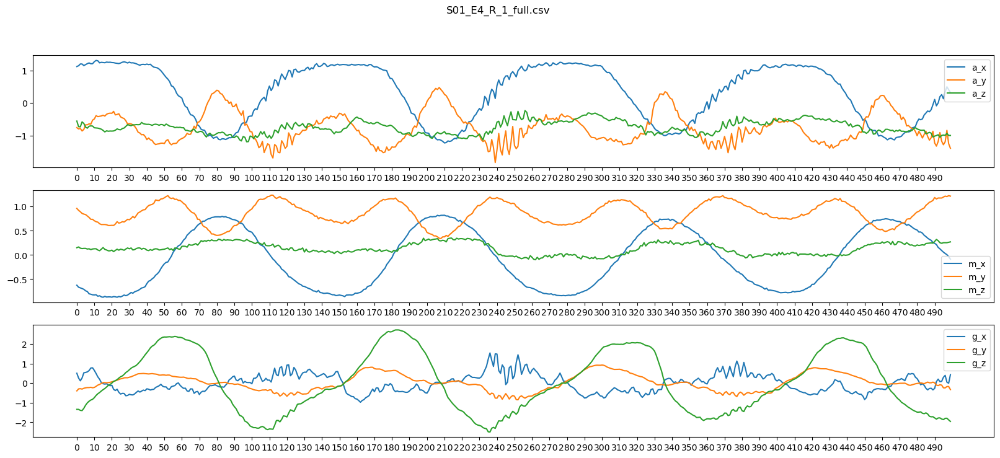

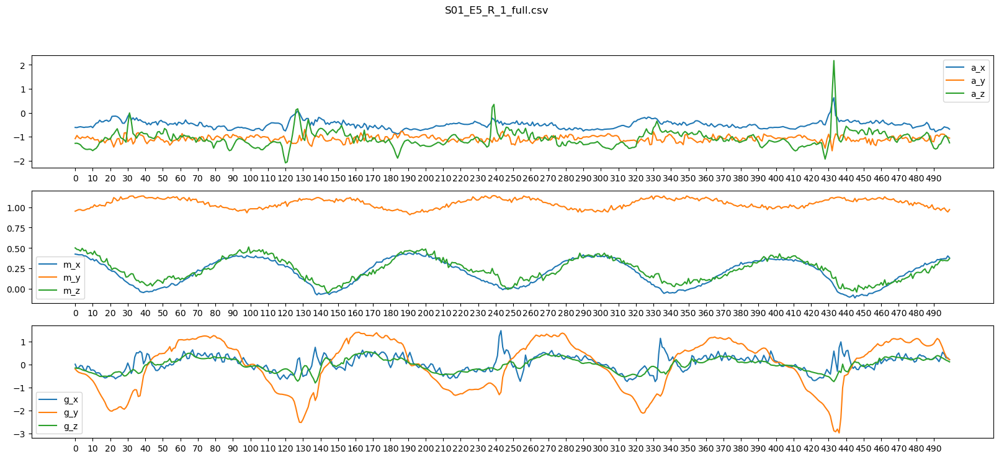

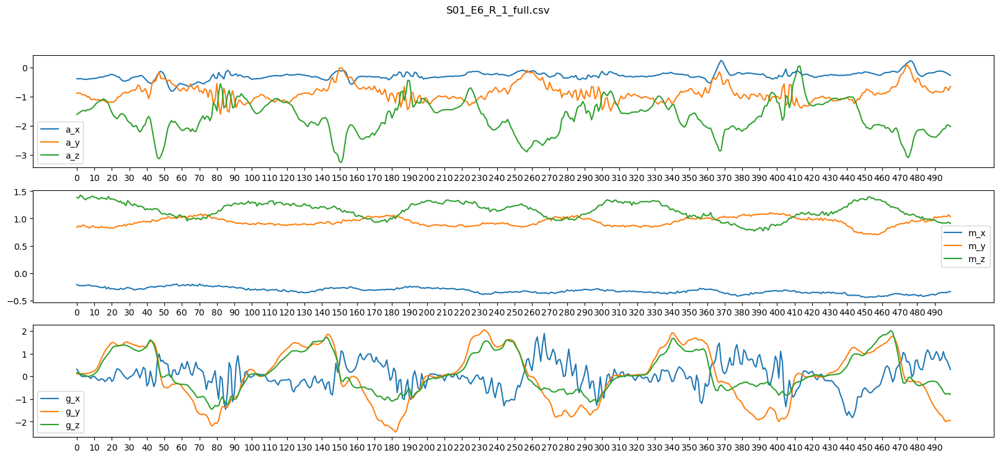

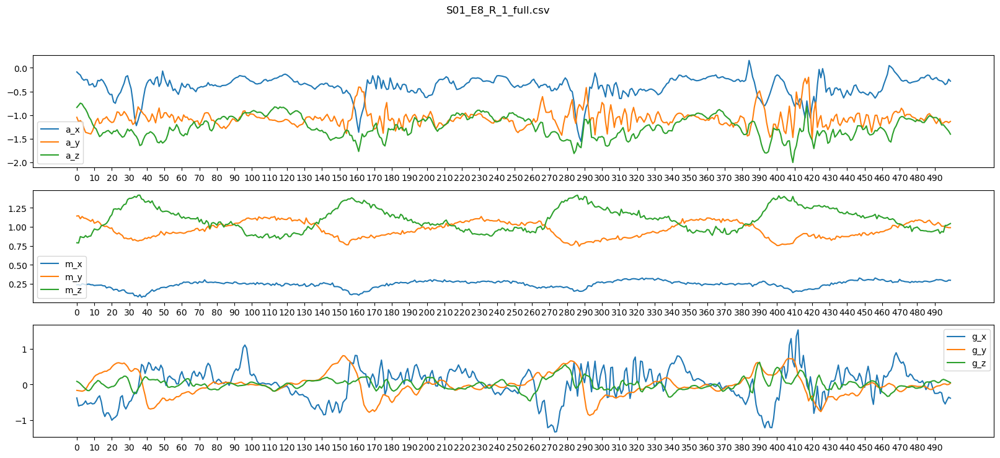

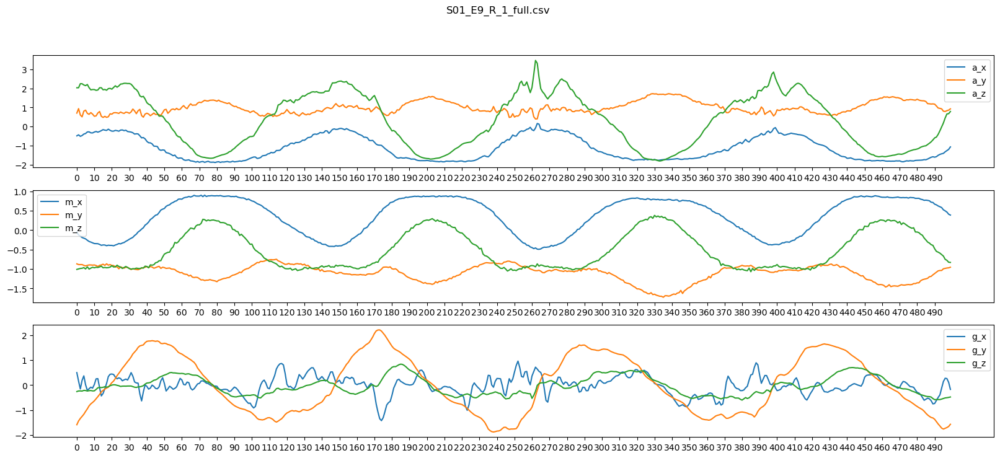

In [6]:
for file in valid_files:
    df = pd.read_csv(file)
    df = df.loc[:, 'a_1':'g_3']
    plot_imu(df.iloc[0:500], 10)

# Determine approximate frequency of each exercise
## IMU frequency

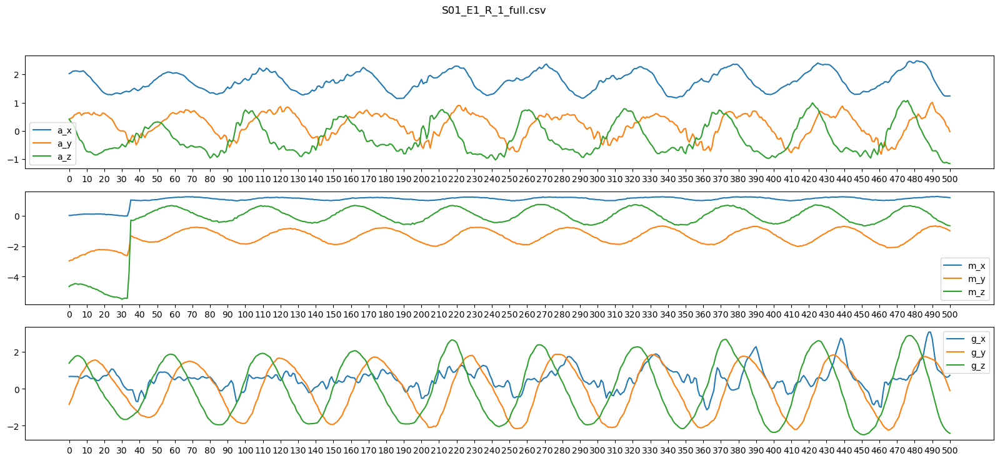

,a_1,a_2,a_3,m_1,m_2,m_3,g_1,g_2,g_3
0,2.027093,0.413261,0.415342,0.010479,-2.972053,-4.648296,0.667643,-0.842078,1.391754
1,2.055466,0.447842,0.314841,0.014760,-2.919924,-4.562251,0.674128,-0.604536,1.525312
2,2.109553,0.479458,0.265156,0.030568,-2.905263,-4.531554,0.671839,-0.408679,1.615240
3,2.119306,0.570357,0.137554,0.049339,-2.792859,-4.468765,0.664591,-0.089176,1.723819
4,2.125513,0.591106,-0.019407,0.045388,-2.773311,-4.463184,0.668406,0.158114,1.782105
...,...,...,...,...,...,...,...,...,...
496,1.293821,0.445865,-1.109100,1.219103,-0.784261,-0.460030,0.791424,0.874590,-2.003838
497,1.237961,0.354967,-1.129426,1.212187,-0.818471,-0.527005,0.692437,0.652952,-2.151719
498,1.237074,0.183050,-1.109100,1.207247,-0.862455,-0.598166,0.631214,0.417077,-2.264128
499,1.233528,0.127720,-1.140718,1.190452,-0.930874,-0.640025,0.643230,0.163117,-2.354055


In [7]:
file = valid_files[0]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']

plot_imu(df, 10)
df

### Test finding frequencies

In [8]:
def plot_peaks(df, peaks):
    fig, axes = plt.subplots(figsize=(20,5))
    axes.plot(df)
    axes.plot(peaks, df[peaks], 'x')
    axes.set_xlabel('Datapoint')
    axes.set_ylabel('Value')
    fig.suptitle(f'{df.name} Peaks')

    plt.show()

In [9]:
df.iloc[0,0]

2.027093095568985

In [11]:
peaks = find_peaks(df.iloc[:, 0], distance=32)[0]
peaks

array([  8,  56, 108, 167, 220, 271, 324, 377, 425, 481], dtype=int64)

In [12]:
# calculate frequency
diff = np.mean(np.diff(peaks))
diff

52.55555555555556

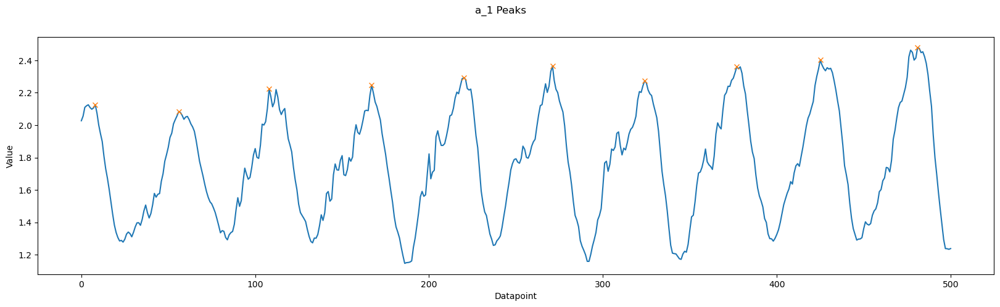

In [15]:
plot_peaks(df.iloc[:,0], peaks)

### Find all peaks for each exercise

In [47]:
def plot_imu_peaks(df, peak_dist=32, tick_size=50):
    # find peaks
    peaks = []
    freq = []
    for key in df.keys():
        p = find_peaks(df[key], distance=peak_dist)[0]
        peaks.append(p)
        freq.append(50 / np.mean(np.diff(p)))
    fig, axes = plt.subplots(3, 1, figsize=(20, 10), tight_layout=True)
    labels = ['a_x', 'a_y', 'a_z', 'm_x', 'm_y', 'm_z', 'g_x', 'g_y', 'g_z']
    n, d = df.shape
    t = np.arange(n)
    t_ticks = np.arange(0, n, tick_size)
    
    fig.suptitle(f'Frequency Analysis: {file.name}')
    
    for i in range(3):
        axes[0].plot(t, df.iloc[:, i], label=labels[i])
        axes[0].plot(peaks[i], df.iloc[:,i][peaks[i]], 'x')
    axes[0].set_title(f'Accelerometer Frequencies [x,y,z]: {freq[:3]}')
    axes[0].legend()
    axes[0].set_xticks(t_ticks)
    for i in range(3, 6):
        axes[1].plot(t, df.iloc[:, i], label=labels[i])
        axes[1].plot(peaks[i], df.iloc[:,i][peaks[i]], 'x')
    axes[1].set_title(f'Magnetometer Frequencies [x,y,z]: {freq[3:6]}')
    axes[1].legend()
    axes[1].set_xticks(t_ticks)
    for i in range(6, 9):
        axes[2].plot(t, df.iloc[:, i], label=labels[i])
        axes[2].plot(peaks[i], df.iloc[:,i][peaks[i]], 'x')
    axes[2].set_title(f'Gyroscope Frequencies [x,y,z]: {freq[6:]}')
    axes[2].legend()
    axes[2].set_xticks(t_ticks)

    plt.show()

#### Exercise 1

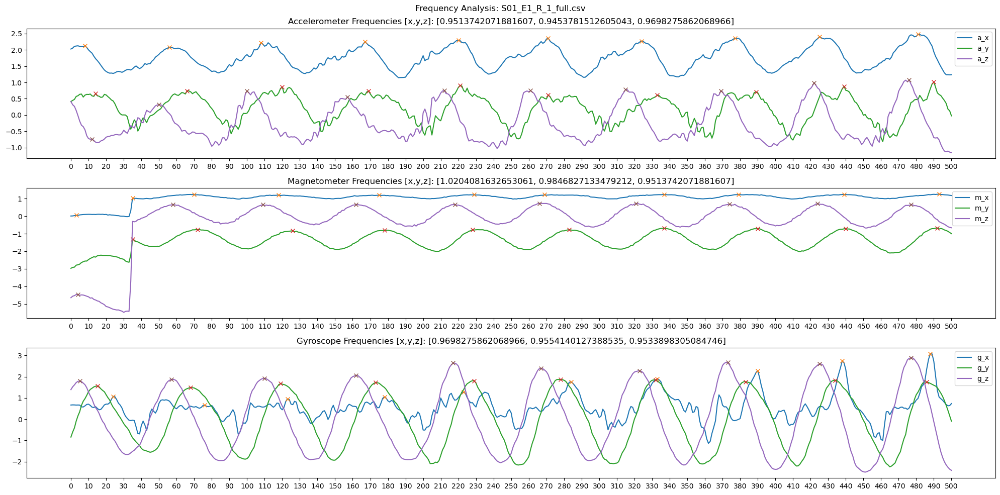

In [48]:
file = valid_files[0]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']
plot_imu_peaks(df, 32, 10)

#### Exercise 2

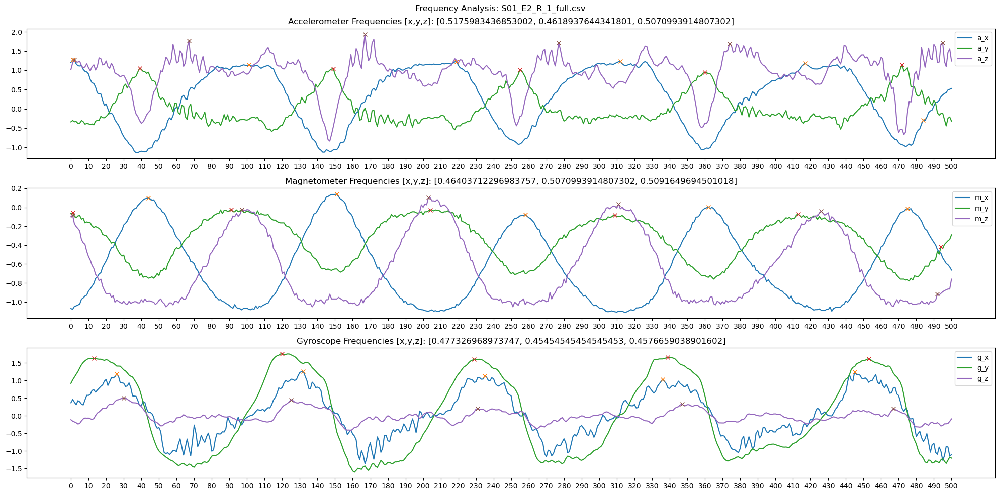

In [50]:
file = valid_files[1]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']
plot_imu_peaks(df, 64, 10)

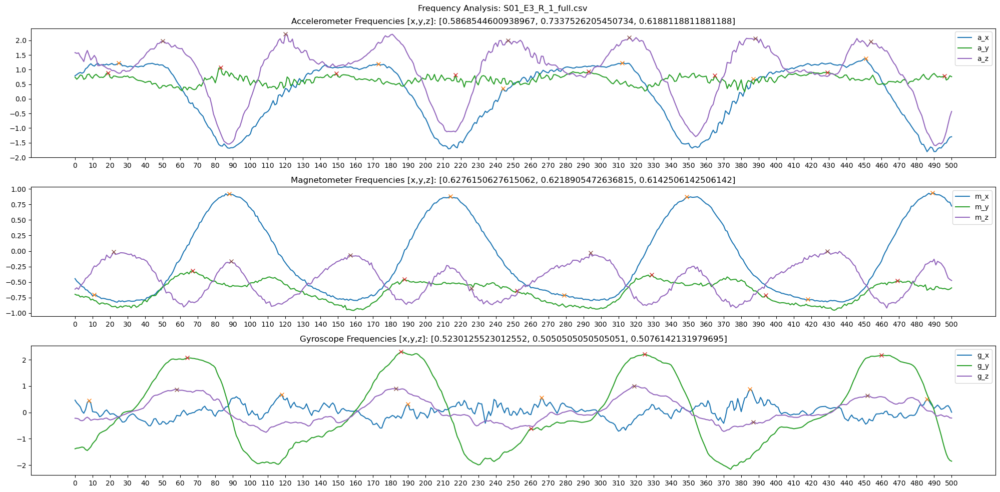

In [51]:
file = valid_files[2]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']
plot_imu_peaks(df, 64, 10)

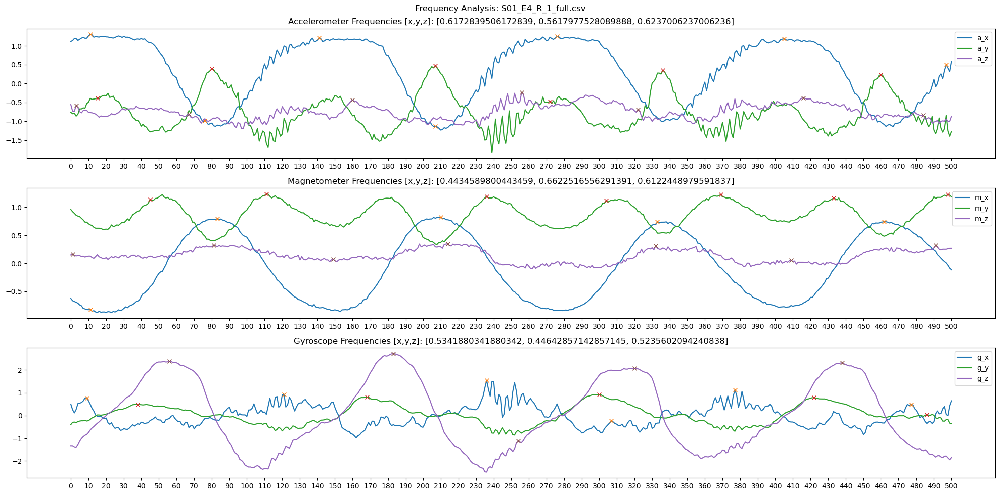

In [52]:
file = valid_files[3]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']
plot_imu_peaks(df, 64, 10)

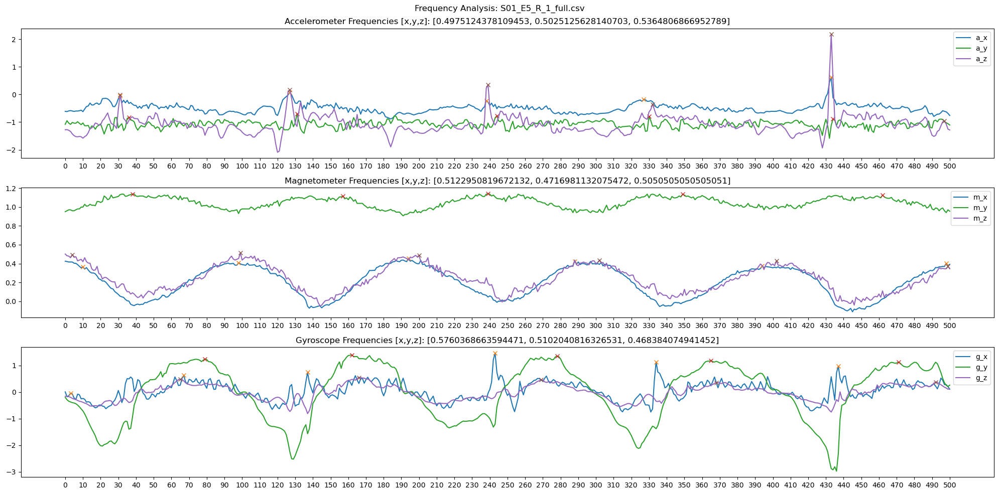

In [53]:
file = valid_files[4]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']
plot_imu_peaks(df, 64, 10)

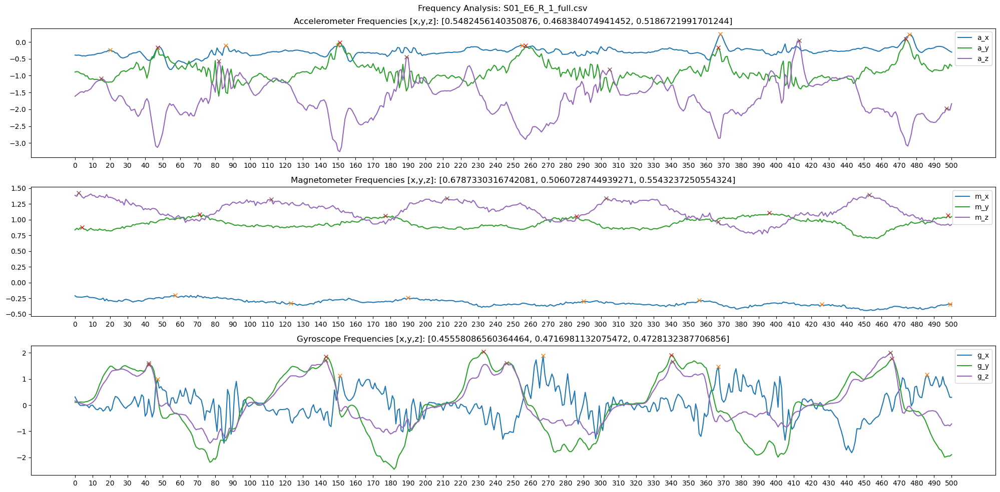

In [54]:
file = valid_files[5]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']
plot_imu_peaks(df, 64, 10)

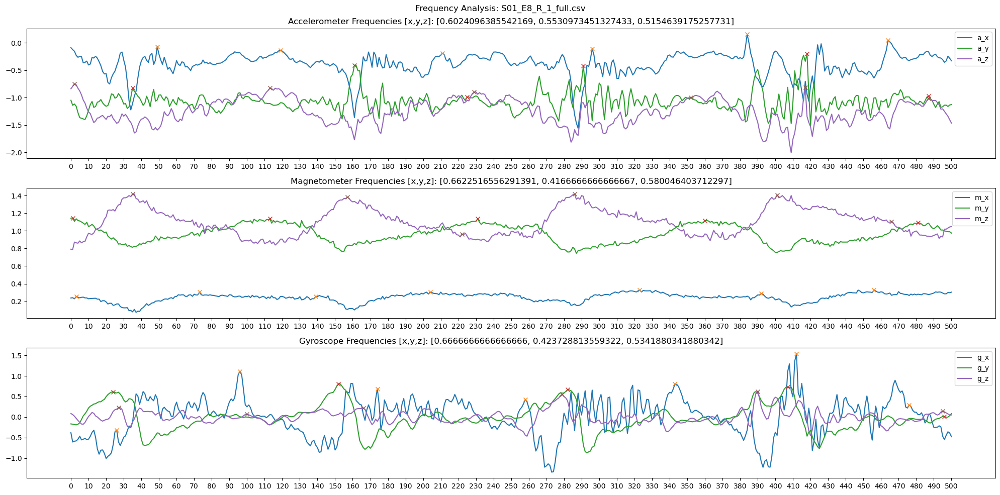

In [55]:
file = valid_files[6]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']
plot_imu_peaks(df, 64, 10)

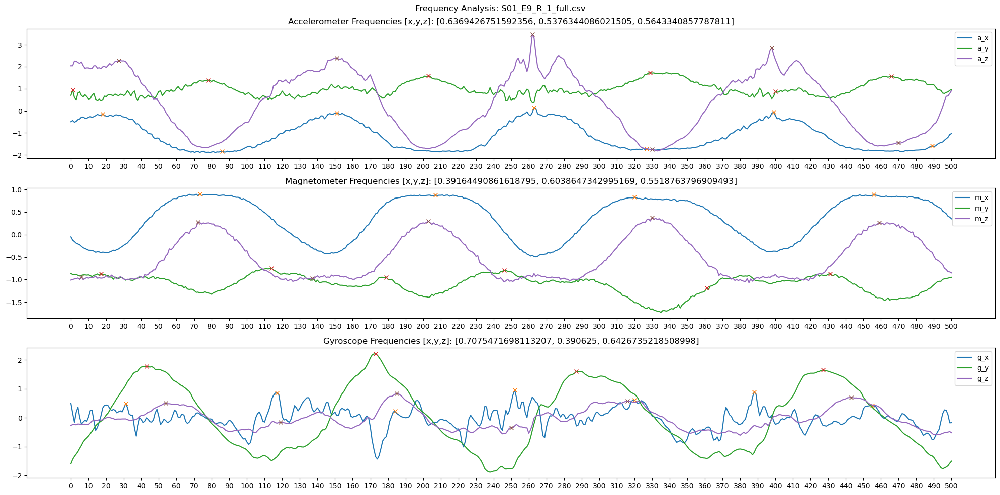

In [56]:
file = valid_files[7]
df = pd.read_csv(file)
df = df.loc[:500, 'a_1':'g_3']
plot_imu_peaks(df, 64, 10)

## Mocap Frequency

In [61]:
def plot_mocap_peaks(df, peak_dist=32, tick_size=50):
    # find peaks
    peaks = []
    freq = []
    labels = df.keys()

    for key in labels:
        p = find_peaks(df[key], distance=peak_dist)[0]
        peaks.append(p)
        freq.append(50 / np.mean(np.diff(p)))
    fig, axes = plt.subplots(2, 1, figsize=(20, 10), tight_layout=True)
    
    n, d = df.shape
    t = np.arange(n)
    t_ticks = np.arange(0, n, tick_size)
    
    fig.suptitle(f'Mocap Frequency Analysis: {file.name}')
    
    for i in range(3):
        axes[0].plot(t, df.iloc[:, i], label=labels[i])
        axes[0].plot(peaks[i], df.iloc[:,i][peaks[i]], 'x')
    axes[0].set_title(f'XYZ Frequencies [x,y,z]: {freq[:3]}')
    axes[0].legend()
    axes[0].set_xticks(t_ticks)
    for i in range(3, 7):
        axes[1].plot(t, df.iloc[:, i], label=labels[i])
        axes[1].plot(peaks[i], df.iloc[:,i][peaks[i]], 'x')
    axes[1].set_title(f'Quaternion Frequencies [x,y,z]: {freq[3:]}')
    axes[1].legend()
    axes[1].set_xticks(t_ticks)
    # for i in range(6, 9):
    #     axes[2].plot(t, df.iloc[:, i], label=labels[i])
    #     axes[2].plot(peaks[i], df.iloc[:,i][peaks[i]], 'x')
    # axes[2].set_title(f'Gyroscope Frequencies [x,y,z]: {freq[6:]}')
    # axes[2].legend()
    # axes[2].set_xticks(t_ticks)

    plt.show()

### Exercise 1

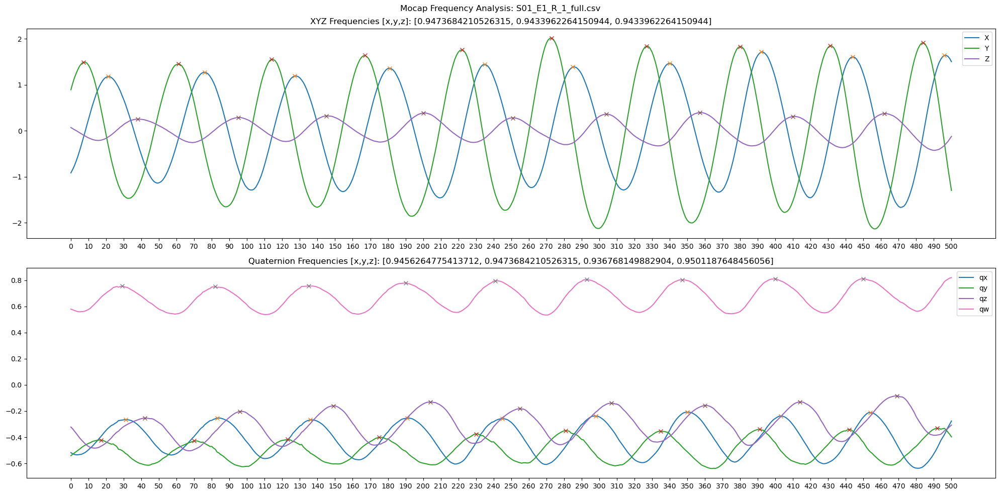

In [63]:
file = valid_files[0]
df = pd.read_csv(file)
df = df.loc[:500, 'X':'qw']
plot_mocap_peaks(df, 32, 10)

## Exercise 2

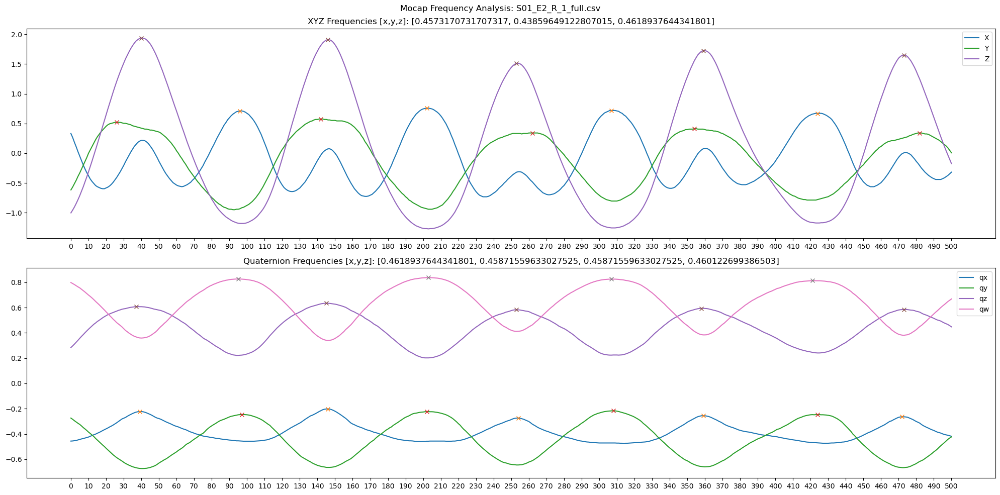

In [65]:
file = valid_files[1]
df = pd.read_csv(file)
df = df.loc[:500, 'X':'qw']
plot_mocap_peaks(df, 64, 10)

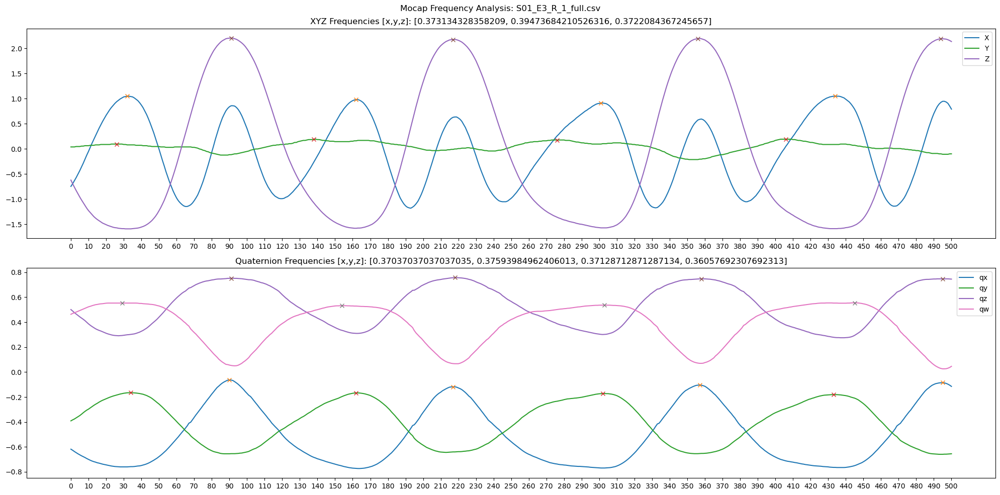

In [66]:
file = valid_files[2]
df = pd.read_csv(file)
df = df.loc[:500, 'X':'qw']
plot_mocap_peaks(df, 64, 10)

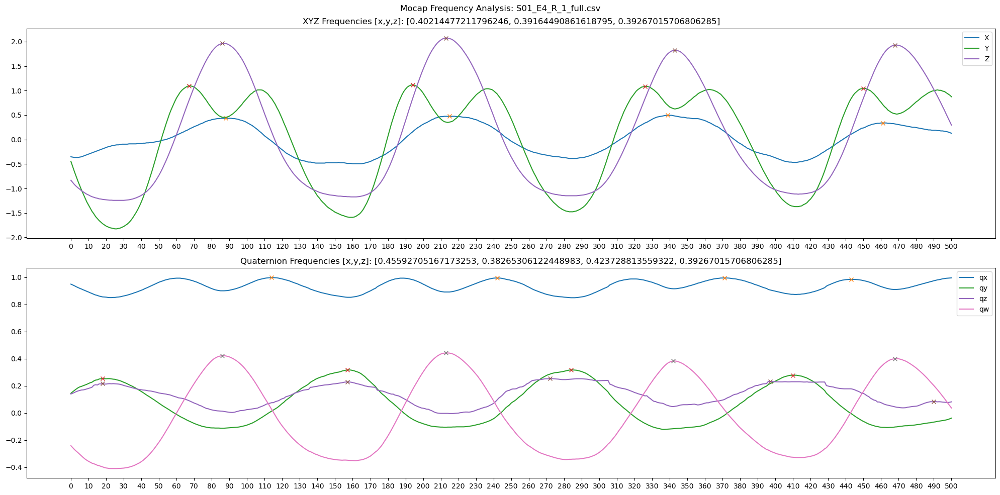

In [67]:
file = valid_files[3]
df = pd.read_csv(file)
df = df.loc[:500, 'X':'qw']
plot_mocap_peaks(df, 64, 10)

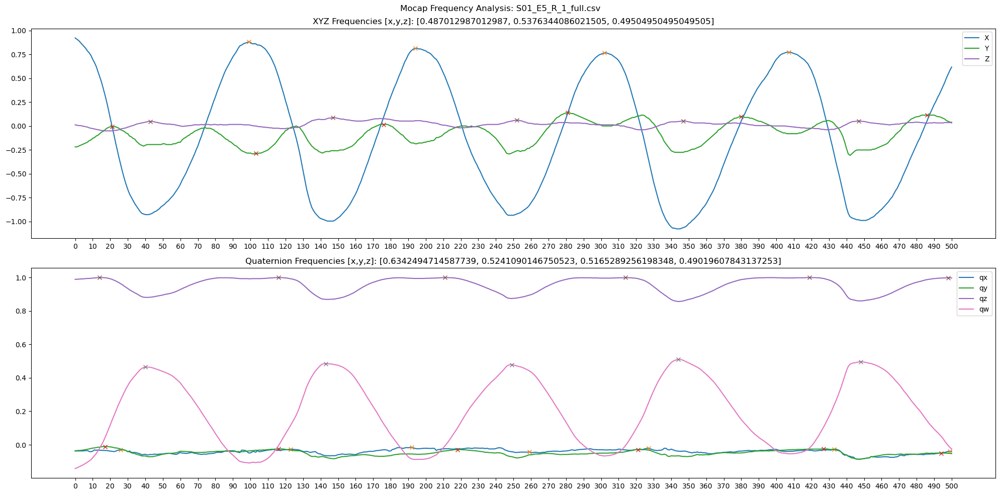

In [68]:
file = valid_files[4]
df = pd.read_csv(file)
df = df.loc[:500, 'X':'qw']
plot_mocap_peaks(df, 64, 10)

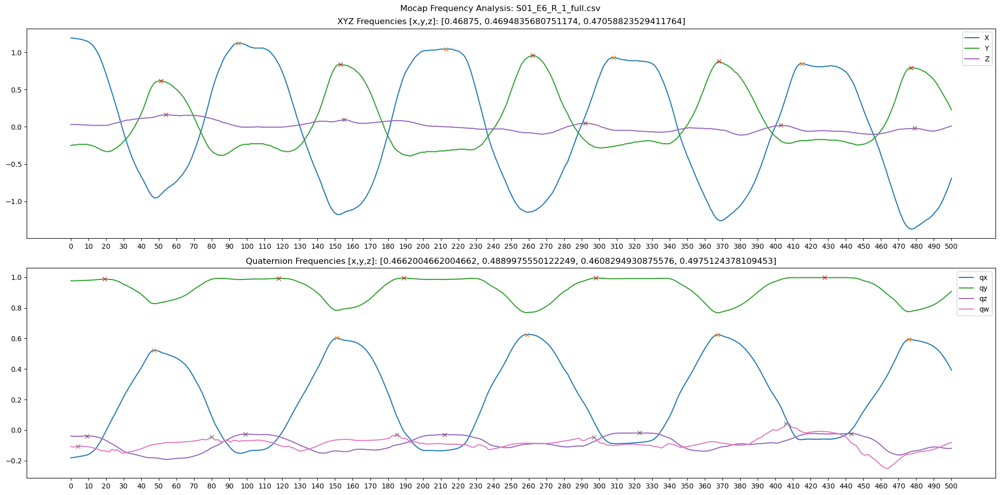

In [69]:
file = valid_files[5]
df = pd.read_csv(file)
df = df.loc[:500, 'X':'qw']
plot_mocap_peaks(df, 64, 10)

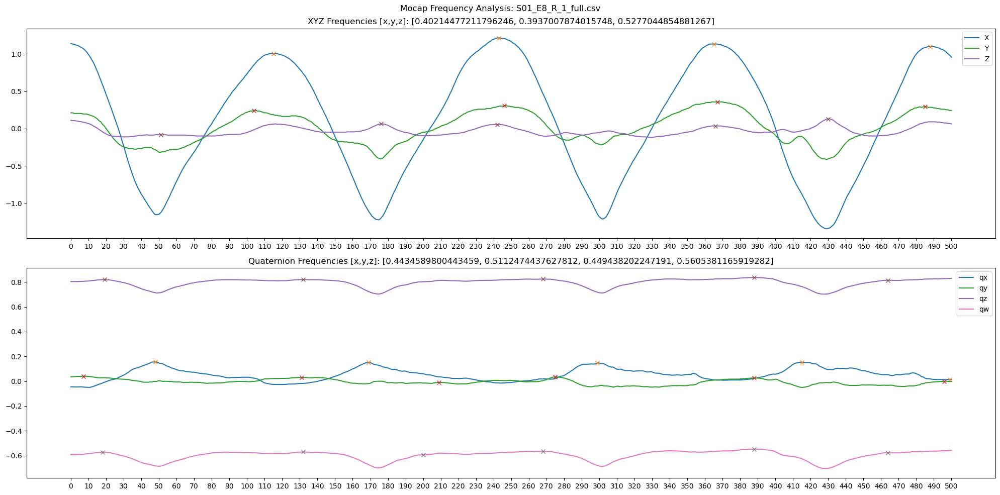

In [70]:
file = valid_files[6]
df = pd.read_csv(file)
df = df.loc[:500, 'X':'qw']
plot_mocap_peaks(df, 64, 10)

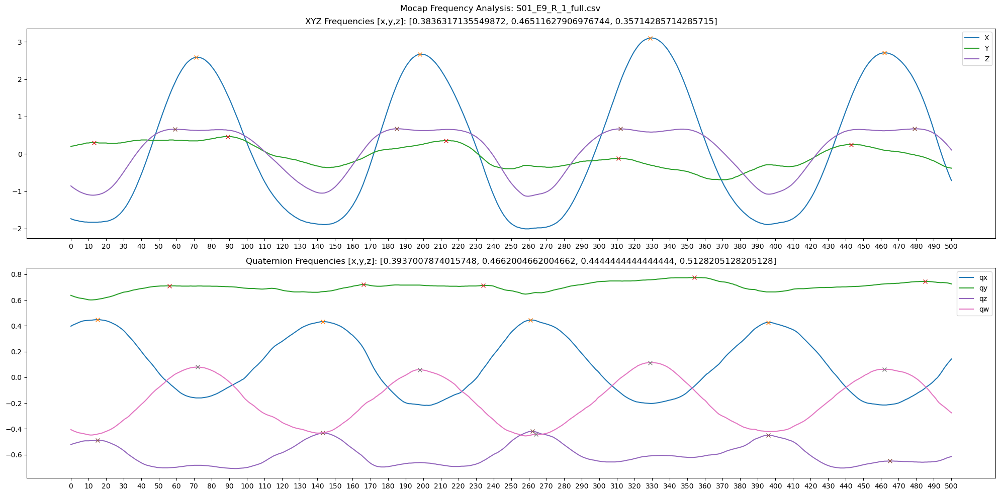

In [71]:
file = valid_files[7]
df = pd.read_csv(file)
df = df.loc[:500, 'X':'qw']
plot_mocap_peaks(df, 64, 10)